# Importing libraries

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier as rfc
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.linear_model import LogisticRegression 
from sklearn.svm import SVC
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.utils.multiclass import unique_labels

# Ignoring Warnings 

In [2]:
warnings.filterwarnings("ignore")

# Importing csv file

In [3]:
csv = pd.read_csv(r"C:\Users\Admin\Downloads\data (1).csv")

# Displaying All Columns: Ensuring Complete Visibility of Data

In [4]:
pd.set_option('display.max_columns', None)

# Data Exploration

In [5]:
csv.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [6]:
csv.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [7]:
csv.corr()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
id,1.000000,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,-0.022114,-0.052511,0.143048,-0.007526,0.137331,0.177742,0.096781,0.033961,0.055239,0.078768,-0.017306,0.025725,0.082405,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866,NaN
radius_mean,0.074626,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,0.679090,-0.097317,0.674172,0.735864,-0.222600,0.206000,0.194204,0.376169,-0.104321,-0.042641,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066,NaN
texture_mean,0.099770,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,0.275869,0.386358,0.281673,0.259845,0.006614,0.191975,0.143293,0.163851,0.009127,0.054458,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205,NaN
perimeter_mean,0.073159,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,0.691765,-0.086761,0.693135,0.744983,-0.202694,0.250744,0.228082,0.407217,-0.081629,-0.005523,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019,NaN
area_mean,0.096893,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,0.732562,-0.066280,0.726628,0.800086,-0.166777,0.212583,0.207660,0.372320,-0.072497,-0.019887,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738,NaN
smoothness_mean,-0.012968,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,0.301467,0.068406,0.296092,0.246552,0.332375,0.318943,0.248396,0.380676,0.200774,0.283607,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316,NaN
compactness_mean,0.000096,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,0.497473,0.046205,0.548905,0.455653,0.135299,0.738722,0.570517,0.642262,0.229977,0.507318,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382,NaN
concavity_mean,0.050080,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,0.631925,0.076218,0.660391,0.617427,0.098564,0.670279,0.691270,0.683260,0.178009,0.449301,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930,NaN
concave points_mean,0.044158,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,0.698050,0.021480,0.710650,0.690299,0.027653,0.490424,0.439167,0.615634,0.095351,0.257584,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661,NaN
symmetry_mean,-0.022114,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,0.303379,0.128053,0.313893,0.223970,0.187321,0.421659,0.342627,0.393298,0.449137,0.331786,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413,NaN


In [8]:
csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

# Checking Null Values In Data

In [9]:
csv.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

# Checking duplicate values

In [10]:
csv.duplicated().sum()

0

# Checking Data Imbalance 

In [11]:
value_count = csv['diagnosis'].value_counts()
print(value_count)

B    357
M    212
Name: diagnosis, dtype: int64


# Transforming Data

In [12]:
csv['diagnosis'].replace({'M':1,'B':0},inplace = True)

In [13]:
del csv['Unnamed: 32']

In [14]:
csv.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# Visualizing Data

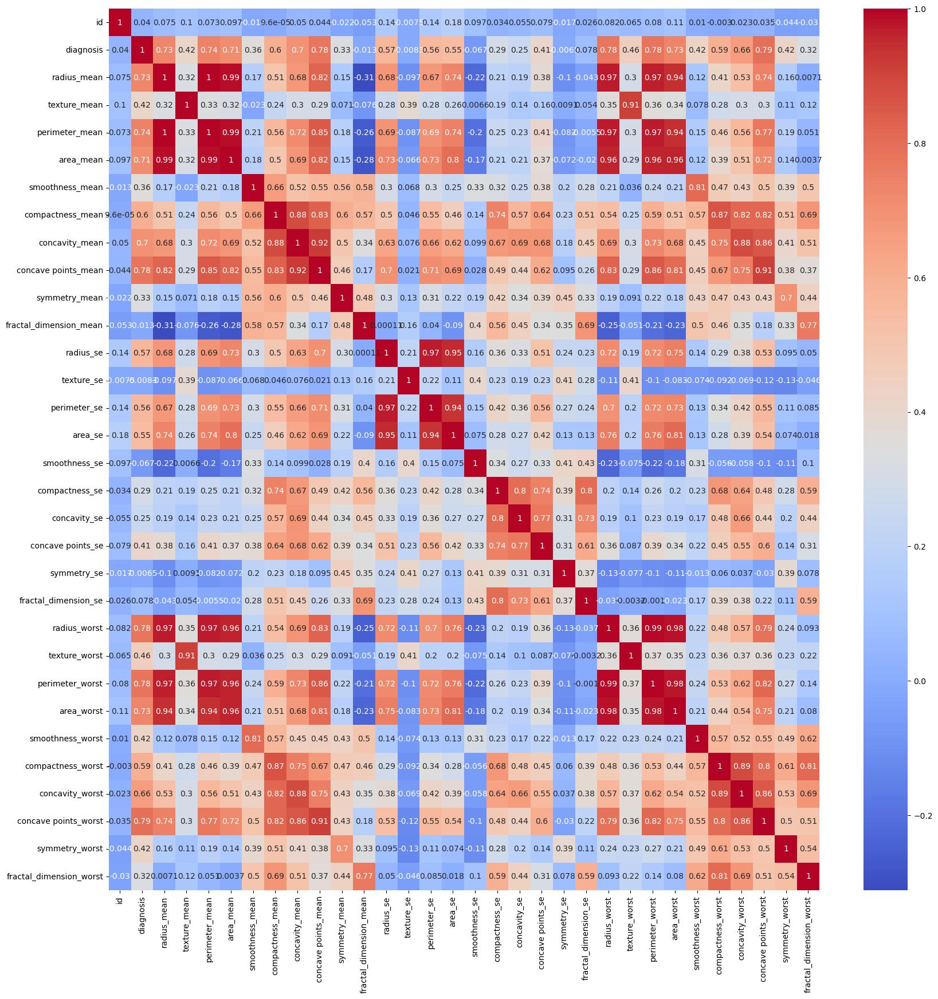

In [15]:
plt.figure(figsize=(20,20))
sns.heatmap(csv.corr(),annot=True,cmap='coolwarm')
plt.show()

In [124]:
plt.figure(figsize=(20,20))
sns.pairplot(csv)
plt.show()

<Figure size 2000x2000 with 0 Axes>

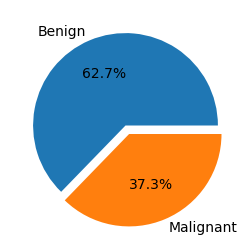

In [16]:
plt.figure(figsize = (3,3))

labels = ["Benign","Malignant"]
explode = [0, 0.1]

plt.pie(csv.diagnosis.value_counts(), labels = labels, explode = explode, autopct = '%1.1f%%')

plt.show()

Text(0.5, 1.0, 'Diagnosis Value Counts')

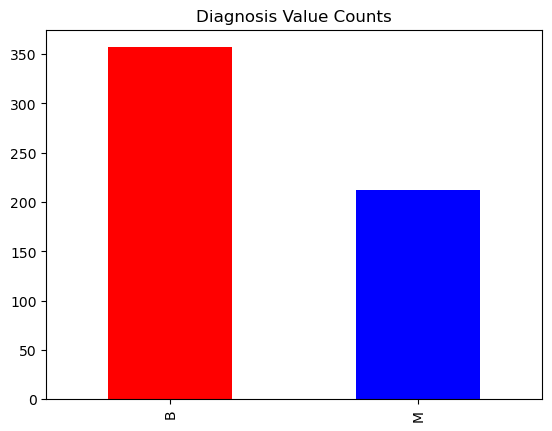

In [17]:
value_count.plot(kind='bar', color=['red', 'blue'])
plt.xlabel = ('diagnosis')
plt.ylabel = ('count')
plt.title('Diagnosis Value Counts')

EDA INSIGHTS

1 Feature Analysis:
Subtitle: Variations in Tumor Characteristics
Features: Perimeter mean, Area mean, Radius mean, Concave Points Mean , Radius se , Perimeter se, Area se, concavity se ,Concavity mean, Worst Perimeter, Worst Area, Worst Radius, Worst Concavity.
Visual Representation:
Subtitle: Boundary and Invasiveness
Include visual comparisons of a Benign tumor with a distinct boundary and a Malignant tumor without a clear boundary.
Rapid Growth Comparison:
Subtitle: Proliferation Rate Analysis
Graphical representation comparing the growth rate of Benign and Malignant tumors

# Chosing x (Independent Features) and y(Dependent)

In [18]:
x =csv.iloc[:,2:]
y=csv['diagnosis']

In [19]:
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [20]:
y.head()

0    1
1    1
2    1
3    1
4    1
Name: diagnosis, dtype: int64

# Spliting data for training and testing 

In [21]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state = 42)

# Using Standard Scaler For Normalization

In [22]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

# Using Random Forest Classifier

In [52]:
model=rfc(max_depth = 20,random_state = 42,max_features =1)
model.fit(x_train,y_train)

RandomForestClassifier(max_depth=20, max_features=1, random_state=42)

# Model Evaluation

In [53]:
y_pred= model.predict(x_train)

In [54]:
ypred= model.predict(x_test)

# Using accuracy

In [55]:
print('Training Accuracy',accuracy_score(y_train,y_pred))

Training Accuracy 1.0


In [56]:
print('Test Accuracy',accuracy_score(y_test,ypred))

Test Accuracy 0.9649122807017544


# Using F1 score 

In [57]:
print('Training F1 Score',f1_score(y_train,y_pred))

Training F1 Score 1.0


In [58]:
print('Test F1 Score',f1_score(y_test,ypred))

Test F1 Score 0.9523809523809524


# Using Confussion Matrix

In [59]:
print('Training Confusion Matrix\n',confusion_matrix(y_train,y_pred))

Training Confusion Matrix
 [[286   0]
 [  0 169]]


In [60]:
print('Test Confusion Matrix\n',confusion_matrix(y_test,ypred))

Test Confusion Matrix
 [[70  1]
 [ 3 40]]


# Classification Report of Model

In [38]:
from sklearn.metrics import classification_report

In [39]:
print('Training Classification Report\n',classification_report(y_train,y_pred))

Training Classification Report
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       286
           1       1.00      1.00      1.00       169

    accuracy                           1.00       455
   macro avg       1.00      1.00      1.00       455
weighted avg       1.00      1.00      1.00       455



In [40]:
print('Test Classification Report\n',classification_report(y_test,ypred))

Test Classification Report
               precision    recall  f1-score   support

           0       0.96      0.99      0.97        71
           1       0.98      0.93      0.95        43

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



# Checking Roc Curve 

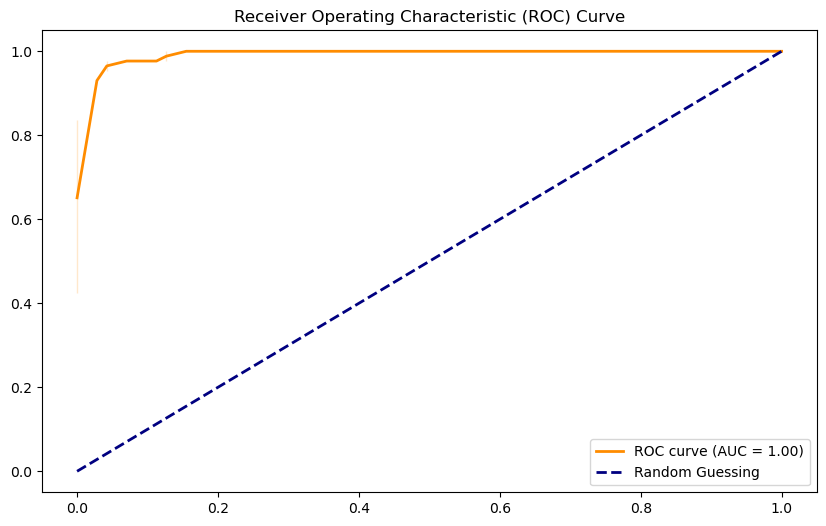

In [41]:
y_scores = model.predict_proba(x_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
sns.lineplot(x=fpr, y=tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guessing')

plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Checking Cross Validation Score 

In [61]:
cv_scores = cross_val_score(model, x_train, y_train, cv=10, scoring='accuracy')
print('Cross Validation Score\n',cv_scores)

Cross Validation Score
 [1.         0.91304348 0.95652174 0.91304348 0.97826087 0.97777778
 0.95555556 0.97777778 0.97777778 0.91111111]


# Testing Model On New Data 

In [62]:
import numpy as np
new_data= np.array([[17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890]])
print('New Data Prediction\n',model.predict(new_data))

New Data Prediction
 [1]


# Checking Probablity of 0 and 1 

In [63]:
probabilities = model.predict_proba(new_data)
print('Probablity\n',probabilities)

Probablity
 [[0.06 0.94]]


# Feature Importance in Random Forest Classifier

In [64]:
feature_importances = model.feature_importances_
feature_names = list(x.columns)
for name, importance in zip(feature_names, feature_importances):
    print(f"{name}: {importance}")

radius_mean: 0.055336048822471604
texture_mean: 0.0254934197919333
perimeter_mean: 0.04006223723677953
area_mean: 0.04804008669997848
smoothness_mean: 0.018864426627210735
compactness_mean: 0.034118639469986875
concavity_mean: 0.05415619192941331
concave points_mean: 0.06789096858561386
symmetry_mean: 0.012344329968476779
fractal_dimension_mean: 0.016723214818016287
radius_se: 0.030399463138603897
texture_se: 0.010692106108124506
perimeter_se: 0.030716400089348898
area_se: 0.05344014977714477
smoothness_se: 0.011069893536806425
compactness_se: 0.012593834334211428
concavity_se: 0.027146810651722388
concave points_se: 0.013925771532785701
symmetry_se: 0.009791644630980588
fractal_dimension_se: 0.014476181629810111
radius_worst: 0.05959541932340802
texture_worst: 0.024377552820876
perimeter_worst: 0.04376106181211152
area_worst: 0.08862648008894586
smoothness_worst: 0.020997031027017884
compactness_worst: 0.033608239794697535
concavity_worst: 0.03440794724193861
concave points_worst: 0.0

# Using Logistic regression 

In [65]:
lr = LogisticRegression()
lr.fit(x_train,y_train)

LogisticRegression()

# Model Evaluation Of Linear Regression  

In [253]:
ypred = lr.predict(x_train)

In [254]:
y_pred = lr.predict(x_test)

# Checking Acurracy

In [255]:
print('Trainning Accuracy',accuracy_score(y_train,ypred))

Trainning Accuracy 0.9868131868131869


In [256]:
print ('Test Accuracy',accuracy_score(y_test,y_pred))

Test Accuracy 0.9736842105263158


# Checking F1 Score

In [257]:
print('Training F1 Score',f1_score(y_train,ypred))

Training F1 Score 0.9821428571428571


In [258]:
print('Test F1 Score',f1_score(y_test,y_pred))

Test F1 Score 0.9647058823529412


# Checking Confussion Matrix 

In [259]:
print('Training Confusion Matrix\n',confusion_matrix(y_train,ypred))

Training Confusion Matrix
 [[284   2]
 [  4 165]]


In [260]:
print('Test Confusion Matrix\n',confusion_matrix(y_test,y_pred))

Test Confusion Matrix
 [[70  1]
 [ 2 41]]


# Checking Classification Report

In [261]:
print('Trainning Classification Report\n',classification_report(y_train,ypred))

Trainning Classification Report
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       286
           1       0.99      0.98      0.98       169

    accuracy                           0.99       455
   macro avg       0.99      0.98      0.99       455
weighted avg       0.99      0.99      0.99       455



In [262]:
print('Test Classification Report\n',classification_report(y_test,y_pred))

Test Classification Report
               precision    recall  f1-score   support

           0       0.97      0.99      0.98        71
           1       0.98      0.95      0.96        43

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



# Checking Roc Curve

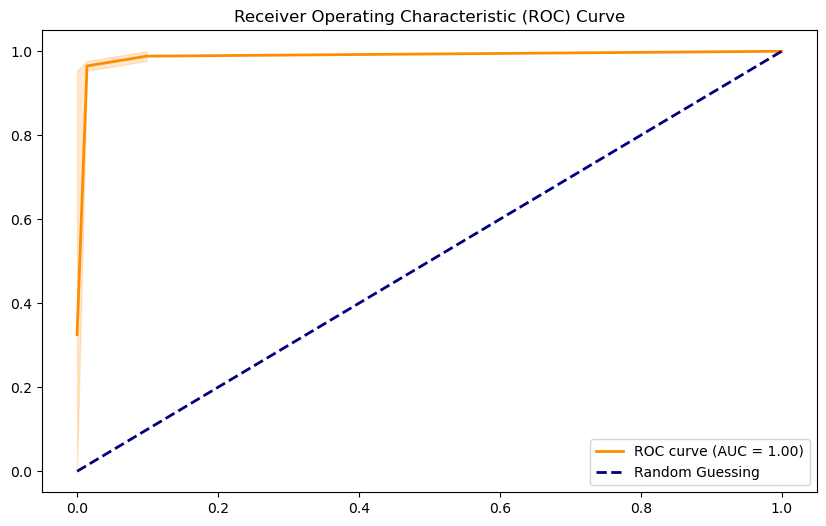

In [263]:
y_scores = lr.predict_proba(x_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
sns.lineplot(x=fpr, y=tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guessing')

plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Checking cross Validation Score Of Our Model 

In [264]:
from sklearn.model_selection import cross_val_score
cv_scores = cross_val_score(lr, x, y, cv=10, scoring='accuracy')
print('Cross Validation Score\n',cv_scores)

Cross Validation Score
 [0.92982456 0.9122807  0.94736842 0.92982456 0.94736842 0.96491228
 0.92982456 0.94736842 0.96491228 0.96428571]


# Checking Accuracy On New Data 

In [265]:
n=np.array([[7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,0.3857,1.428,2.548,19.15,0.007189,0.00466,0.00000,0.00000,0.02676,0.002783,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039]])
print('New Data Prediction\n',lr.predict(n))

New Data Prediction
 [1]


# Checking Probablity of 0 and 1 

In [266]:
probabilities = lr.predict_proba(n)
print('New Data Probablity\n',probabilities)

New Data Probablity
 [[0. 1.]]


# Using SVC Model

In [316]:
svc = SVC(probability=True)
svc.fit(x_train,y_train)

SVC(probability=True)

# Model Evaluation Of SVC

In [268]:
predict = svc.predict(x_train)

In [269]:
ypredict = svc.predict(x_test)

# Checking Accuracy

In [270]:
print('Training Accuracy',accuracy_score(y_train,predict))

Training Accuracy 0.989010989010989


In [271]:
print('Test Accuracy',accuracy_score(y_test,ypredict))

Test Accuracy 0.9824561403508771


# Checking F1 Score 

In [272]:
print('Training F1 Score',f1_score(y_train,predict))

Training F1 Score 0.9849849849849849


In [273]:
print('Test F1 Score',f1_score(y_test,ypredict))

Test F1 Score 0.9761904761904763


# Checking Confusion Matrix 

In [274]:
print('Training F1 Score\n',confusion_matrix(y_train,predict))

Training F1 Score
 [[286   0]
 [  5 164]]


In [275]:
print('Test F1 Score\n',confusion_matrix(y_test,ypredict))

Test F1 Score
 [[71  0]
 [ 2 41]]


# Checking Classification Report 

In [276]:
print('Training Clasification Report\n',classification_report(y_train,predict))

Training Clasification Report
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       286
           1       1.00      0.97      0.98       169

    accuracy                           0.99       455
   macro avg       0.99      0.99      0.99       455
weighted avg       0.99      0.99      0.99       455



In [277]:
print('Test Classification Report\n',classification_report(y_test,ypredict))

Test Classification Report
               precision    recall  f1-score   support

           0       0.97      1.00      0.99        71
           1       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



# Checking Roc Curve

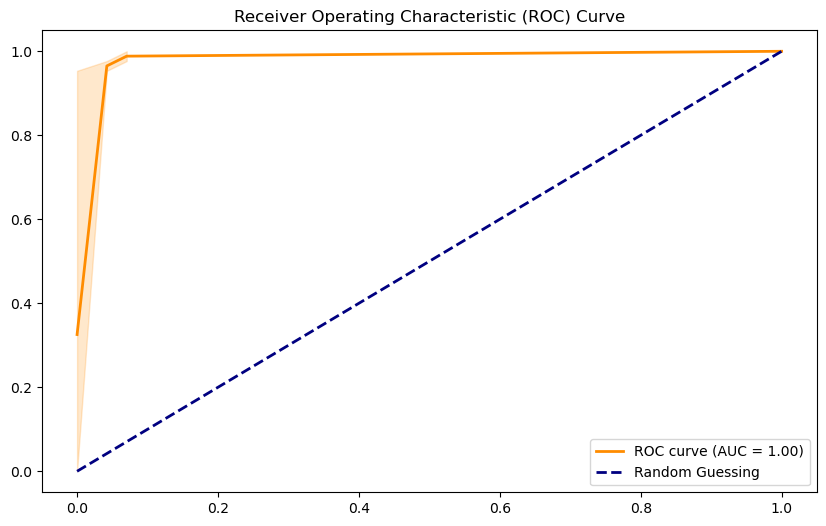

In [278]:
y_scores = svc.predict_proba(x_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
sns.lineplot(x=fpr, y=tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guessing')

plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Checking Cross Val Score 

In [279]:
from sklearn.model_selection import cross_val_score
cv_scores = cross_val_score(svc, x, y, cv=10, scoring='accuracy')
print('Cross Validation Score\n',cv_scores)

Cross Validation Score
 [0.89473684 0.84210526 0.89473684 0.92982456 0.92982456 0.92982456
 0.94736842 0.92982456 0.92982456 0.91071429]


# Checking Accuracy On New Data 

In [280]:
n=np.array([[7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,0.3857,1.428,2.548,19.15,0.007189,0.00466,0.00000,0.00000,0.02676,0.002783,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039]])
print('New Data Prediction\n',svc.predict(n))

New Data Prediction
 [1]


# Checking Probablity of 0 and 1 

In [281]:
probabilities = svc.predict_proba(n)
print('Probablity\n',probabilities)

Probablity
 [[0.23087444 0.76912556]]


# Using Stacking Classifier 

In [282]:
from sklearn.ensemble import StackingClassifier

# Model For Stacking Are Random Forest Classifier, Linear Regression And SVC 

In [307]:
model=rfc()
lr = LogisticRegression()
svc = SVC()

In [379]:
stacked_model = StackingClassifier(
    estimators=[('model', model), ('lr', lr), ('svc', svc)],
    final_estimator=rfc()
)

In [380]:
stacked_model.fit(x_train, y_train)

StackingClassifier(estimators=[('model', RandomForestClassifier()),
                               ('lr', LogisticRegression()),
                               ('svc', SVC(probability=True))],
                   final_estimator=RandomForestClassifier())

In [381]:
ypred = stacked_model.predict(x_train)

In [382]:
y_pred = stacked_model.predict(x_test) 

# Checking Accuracy

In [383]:
print('Training Accuracy',accuracy_score(y_train,ypred))

Training Accuracy 0.9978021978021978


In [384]:
print('Test Accuracy',accuracy_score(y_test,y_pred))


Test Accuracy 0.9649122807017544


# Checking F1 Score

In [385]:
print('Training F1 Score',f1_score(y_train,ypred))

Training F1 Score 0.9970326409495549


In [386]:
print('Test F1 Score',f1_score(y_test,y_pred))

Test F1 Score 0.9523809523809524


# Checking Confusion Matrix

In [387]:
print('Training Confusion Matrix\n',confusion_matrix(y_train,ypred))

Training Confusion Matrix
 [[286   0]
 [  1 168]]


In [388]:
print('Test Confussion Matrix\n',confusion_matrix(y_test,y_pred))

Test Confussion Matrix
 [[70  1]
 [ 3 40]]


# Checking Classification Report 

In [294]:
print('Training Classification Report\n',classification_report(y_train,predict))

Training Classification Report
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       286
           1       1.00      0.97      0.98       169

    accuracy                           0.99       455
   macro avg       0.99      0.99      0.99       455
weighted avg       0.99      0.99      0.99       455



In [295]:
print('Test Classification Report\n',classification_report(y_test,y_pred))

Test Classification Report
               precision    recall  f1-score   support

           0       0.97      0.99      0.98        71
           1       0.98      0.95      0.96        43

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



# Checking Roc Curve

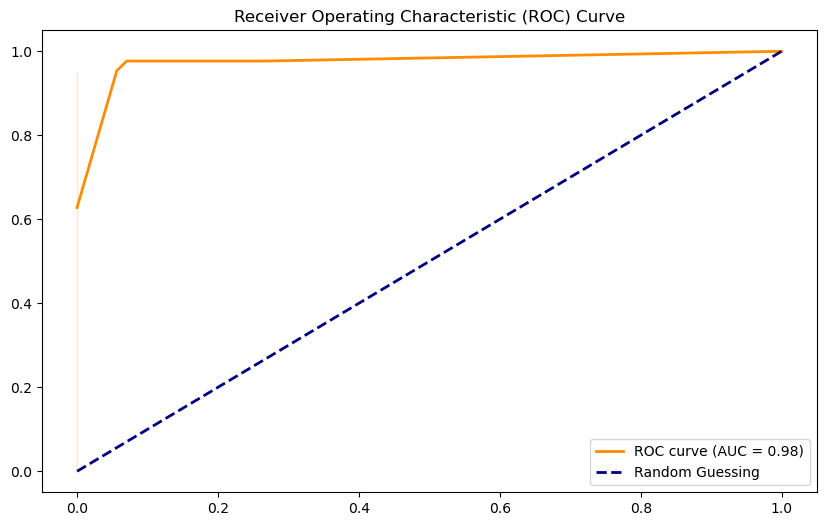

In [296]:
y_scores = stacked_model.predict_proba(x_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
sns.lineplot(x=fpr, y=tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guessing')

plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Checking Cross Validation Score

In [297]:
cv_scores = cross_val_score(stacked_model, x, y, cv=10, scoring='accuracy')
print('Cross Validation\n',cv_scores)

Cross Validation
 [1.         0.9122807  0.92982456 0.96491228 1.         0.98245614
 0.96491228 0.96491228 0.98245614 0.98214286]


# Feature Importance in Stacking Classifier Model

In [298]:
importances = stacked_model.final_estimator_.feature_importances_
feature_names = list(x.columns)

for feature, importance in zip(feature_names, importances):
    print(f"{feature}: {importance}")

radius_mean: 0.3204990706383319
texture_mean: 0.3277273689038952
perimeter_mean: 0.3517735604577729


# Checking Acurracy on New Data

In [299]:
n=np.array([[7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,0.3857,1.428,2.548,19.15,0.007189,0.00466,0.00000,0.00000,0.02676,0.002783,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039]])
print('New Data Prediction\n',stacked_model.predict(n))

New Data Prediction
 [1]


# Checking Probablity Of 0 And 1 

In [300]:
probabilities = stacked_model.predict_proba(n)
print('probablity\n',probabilities)

probablity
 [[0. 1.]]


# Comparing The Accuracy OF All Models 

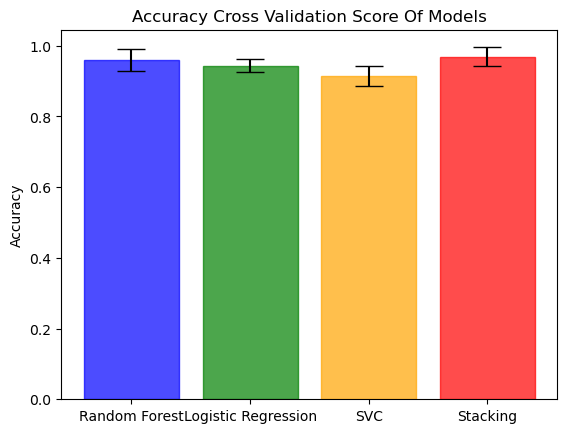

In [301]:
classifiers = [model, lr, svc, stacked_model]
classifier_names = ['Random Forest', 'Logistic Regression', 'SVC', 'Stacking']
colors = ['blue', 'green', 'orange', 'red']
results = []
for classifier, name, color in zip(classifiers, classifier_names, colors):
    scores = cross_val_score(classifier, x, y, cv=10, scoring='accuracy')
    results.append((name, scores.mean(), scores.std(), color))
names, mean_scores, std_scores, bar_colors = zip(*results)
fig, ax = plt.subplots()
bars = ax.bar(names, mean_scores, yerr=std_scores, align='center', alpha=0.7, capsize=10)
for bar, color in zip(bars, bar_colors):
    bar.set_color(color)
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy Cross Validation Score Of Models')
plt.show()

# Comparing The F1 Score OF All Models

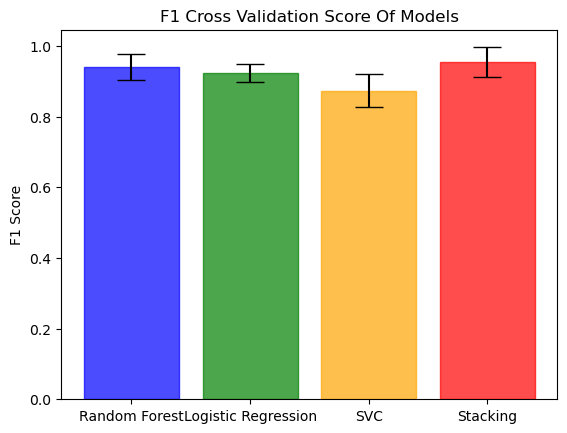

In [302]:
classifiers = [model, lr, svc, stacked_model]
classifier_names = ['Random Forest', 'Logistic Regression', 'SVC', 'Stacking']
colors = ['blue', 'green', 'orange', 'red']
results = []
for classifier, name, color in zip(classifiers, classifier_names, colors):
    scores = cross_val_score(classifier, x, y, cv=10, scoring='f1')
    results.append((name, scores.mean(), scores.std(), color))
names, mean_scores, std_scores, bar_colors = zip(*results)
fig, ax = plt.subplots()
bars = ax.bar(names, mean_scores, yerr=std_scores, align='center', alpha=0.7, capsize=10)
for bar, color in zip(bars, bar_colors):
    bar.set_color(color)
ax.set_ylabel('F1 Score')
ax.set_title('F1 Cross Validation Score Of Models')
plt.show()

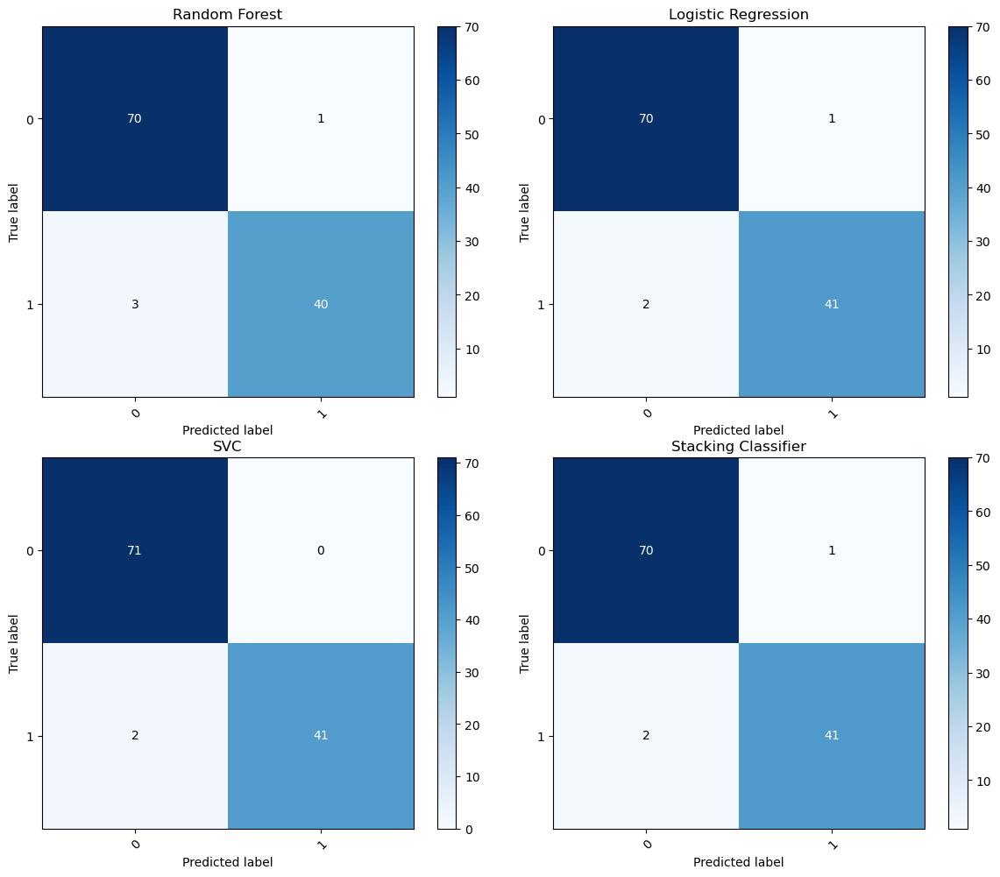

In [317]:
rfc_pred = model.predict(x_test)
lr_pred = lr.predict(x_test)
svc_pred = svc.predict(x_test)
stacking_pred = stacked_model.predict(x_test)

# Compute confusion matrices
conf_matrix_rfc = confusion_matrix(y_test, rfc_pred)
conf_matrix_lr = confusion_matrix(y_test, lr_pred)
conf_matrix_svc = confusion_matrix(y_test, svc_pred)
conf_matrix_stacking = confusion_matrix(y_test, stacking_pred)

# Plot confusion matrices
class_names = unique_labels(y_test, rfc_pred)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for ax, conf_matrix, title in zip(axes.flatten(), [conf_matrix_rfc, conf_matrix_lr, conf_matrix_svc, conf_matrix_stacking],
                                  ['Random Forest', 'Logistic Regression', 'SVC', 'Stacking Classifier']):
    im = ax.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    ax.figure.colorbar(im, ax=ax)

    # Show all ticks
    ax.set(xticks=np.arange(conf_matrix.shape[1]),
           yticks=np.arange(conf_matrix.shape[0]),
           xticklabels=class_names, yticklabels=class_names,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    # Loop over data dimensions and create text annotations
    fmt = 'd'
    thresh = conf_matrix.max() / 2.
    for i in range(conf_matrix.shape[0]):
        for j in range(conf_matrix.shape[1]):
            ax.text(j, i, format(conf_matrix[i, j], fmt),
                    ha="center", va="center",
                    color="white" if conf_matrix[i, j] > thresh else "black")

fig.tight_layout()
plt.show()

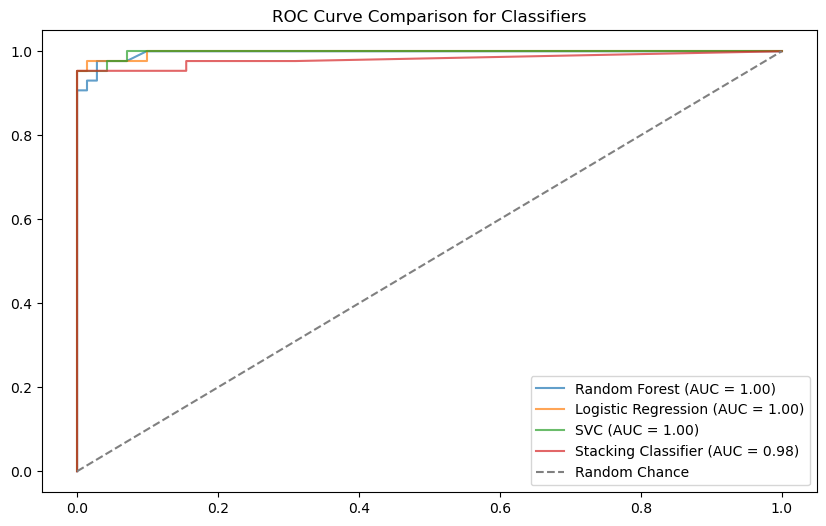

In [320]:
rfc_probs = model.predict_proba(x_test)[:, 1]
lr_probs = lr.predict_proba(x_test)[:, 1]
svc_probs = svc.predict_proba(x_test)[:, 1]
stacking_probs = stacked_model.predict_proba(x_test)[:, 1]

rfc_fpr, rfc_tpr, _ = roc_curve(y_test, rfc_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
svc_fpr, svc_tpr, _ = roc_curve(y_test, svc_probs)
stacking_fpr, stacking_tpr, _ = roc_curve(y_test, stacking_probs)

rfc_auc = auc(rfc_fpr, rfc_tpr)
lr_auc = auc(lr_fpr, lr_tpr)
svc_auc = auc(svc_fpr, svc_tpr)
stacking_auc = auc(stacking_fpr, stacking_tpr)

plt.figure(figsize=(10, 6))

# Adjust alpha for transparency
plt.plot(rfc_fpr, rfc_tpr, label=f'Random Forest (AUC = {rfc_auc:.2f})', alpha=0.7)
plt.plot(lr_fpr, lr_tpr, label=f'Logistic Regression (AUC = {lr_auc:.2f})', alpha=0.7)
plt.plot(svc_fpr, svc_tpr, label=f'SVC (AUC = {svc_auc:.2f})', alpha=0.7)
plt.plot(stacking_fpr, stacking_tpr, label=f'Stacking Classifier (AUC = {stacking_auc:.2f})', alpha=0.7)

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Chance')

plt.title('ROC Curve Comparison for Classifiers')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

# Checking model Accuracy With Smote  

In [321]:
csv = pd.read_csv(r"C:\Users\Admin\Downloads\data (1).csv")

In [322]:
csv['diagnosis'].replace({'M':1,'B':0},inplace = True)

In [323]:
del csv['Unnamed: 32']

In [324]:
x =csv.iloc[:,2:]
y=csv['diagnosis']

In [325]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state = 42)

# Using Smote For Oversampling IN Data

In [326]:
from imblearn.over_sampling import SMOTE

In [327]:
smote = SMOTE(random_state=42)
x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)

In [328]:
print(x_train_resampled.shape)
n = (y_train_resampled.value_counts())

(572, 30)


# Visualization Of Solving Imbalance Data

Text(0.5, 1.0, 'Diagnosis Value Counts')

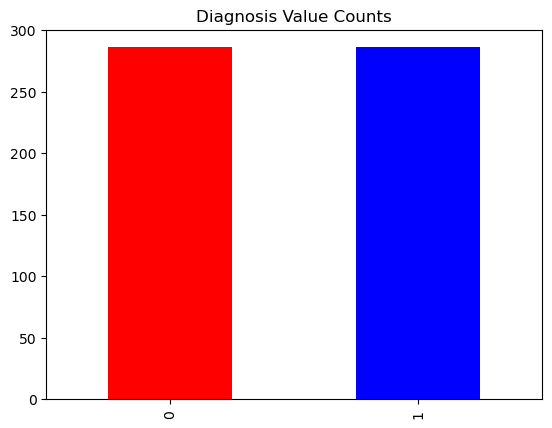

In [329]:
n.plot(kind='bar', color=['red', 'blue'])
plt.xlabel = ('diagnosis')
plt.ylabel = ('count')
plt.title('Diagnosis Value Counts')

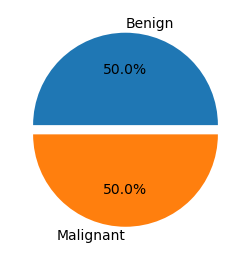

In [330]:
plt.figure(figsize = (3,3))

labels = ["Benign","Malignant"]
explode = [0, 0.1]

plt.pie(y_train_resampled.value_counts(), labels = labels, explode = explode, autopct = '%1.1f%%')

plt.show()

# Using Random Forest Classifier(rfc)

In [390]:
model=rfc()
model.fit(x_train_resampled,y_train_resampled)

RandomForestClassifier()

In [391]:
y_pred= model.predict(x_train_resampled)
ypred= model.predict(x_test)

In [392]:
print('Training Accuracy',accuracy_score(y_train_resampled,y_pred))
print( 'Training F1 score',f1_score(y_train_resampled,y_pred))
print('Training Confusion Matrix\n', confusion_matrix(y_train_resampled, y_pred))

Training Accuracy 1.0
Training F1 score 1.0
Training Confusion Matrix
 [[286   0]
 [  0 286]]


In [393]:
print('Test Accuracy', accuracy_score(y_test,ypred))
print('Test F1 score',f1_score(y_test,ypred))
print('Test Confusion Matrix\n',confusion_matrix(y_test,ypred))

Test Accuracy 0.9736842105263158
Test F1 score 0.9647058823529412
Test Confusion Matrix
 [[70  1]
 [ 2 41]]


# Using Logistic Regression

In [394]:
lr = LogisticRegression()
lr.fit(x_train_resampled,y_train_resampled)

LogisticRegression()

In [395]:
y_pred= lr.predict(x_train_resampled)
ypred= lr.predict(x_test)

In [396]:
print('Training Accuracy',accuracy_score(y_train_resampled,y_pred))
print( 'Training F1 score',f1_score(y_train_resampled,y_pred))
print('Training Confusion Matrix\n', confusion_matrix(y_train_resampled, y_pred))

Training Accuracy 0.9562937062937062
Training F1 score 0.9557522123893805
Training Confusion Matrix
 [[277   9]
 [ 16 270]]


In [397]:
print('Test Accuracy', accuracy_score(y_test,ypred))
print('Test F1 score',f1_score(y_test,ypred))
print('Test Confusion Matrix\n',confusion_matrix(y_test,ypred))

Test Accuracy 0.9649122807017544
Test F1 score 0.9523809523809524
Test Confusion Matrix
 [[70  1]
 [ 3 40]]


# Using SVC model 

In [398]:
svc = SVC(probability = True)
svc.fit(x_train_resampled,y_train_resampled)

SVC(probability=True)

In [399]:
y_pred= svc.predict(x_train_resampled)
ypred= svc.predict(x_test)

In [400]:
print('Training Accuracy',accuracy_score(y_train_resampled,y_pred))
print( 'Training F1 score',f1_score(y_train_resampled,y_pred))
print('Training Confusion Matrix\n', confusion_matrix(y_train_resampled, y_pred))

Training Accuracy 0.8986013986013986
Training F1 score 0.8941605839416059
Training Confusion Matrix
 [[269  17]
 [ 41 245]]


In [401]:
print('Test Accuracy', accuracy_score(y_test,ypred))
print('Test F1 score',f1_score(y_test,ypred))
print('Test Confusion Matrix\n',confusion_matrix(y_test,ypred))

Test Accuracy 0.9473684210526315
Test F1 score 0.9268292682926831
Test Confusion Matrix
 [[70  1]
 [ 5 38]]


# Using Stacking MODEL 

In [402]:
from sklearn.ensemble import StackingClassifier

In [403]:
model=rfc()
lr = LogisticRegression()
svc = SVC()

In [404]:
stacked_model = StackingClassifier(
    estimators=[('model', model), ('lr', lr), ('svc', svc)],
    final_estimator=rfc()
)

In [405]:
stacked_model.fit(x_train_resampled, y_train_resampled)

StackingClassifier(estimators=[('model', RandomForestClassifier()),
                               ('lr', LogisticRegression()), ('svc', SVC())],
                   final_estimator=RandomForestClassifier())

In [406]:
y_pred= stacked_model.predict(x_train_resampled)
ypred= stacked_model.predict(x_test)

In [407]:
print('Training Accuracy',accuracy_score(y_train_resampled,y_pred))
print( 'Training F1 score',f1_score(y_train_resampled,y_pred))
print('Training Confusion Matrix\n', confusion_matrix(y_train_resampled, y_pred))

Training Accuracy 0.9947552447552448
Training F1 score 0.9947643979057592
Training Confusion Matrix
 [[284   2]
 [  1 285]]


In [408]:
print('Test Accuracy', accuracy_score(y_test,ypred))
print('Test F1 score',f1_score(y_test,ypred))
print('Test Confusion Matrix\n',confusion_matrix(y_test,ypred))

Test Accuracy 0.9736842105263158
Test F1 score 0.963855421686747
Test Confusion Matrix
 [[71  0]
 [ 3 40]]


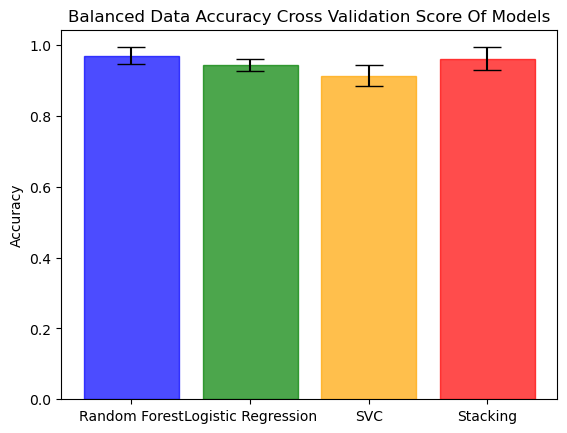

In [350]:
classifiers = [model, lr, svc, stacked_model]
classifier_names = ['Random Forest', 'Logistic Regression', 'SVC', 'Stacking']
colors = ['blue', 'green', 'orange', 'red']
results = []
for classifier, name, color in zip(classifiers, classifier_names, colors):
    scores = cross_val_score(classifier, x, y, cv=10, scoring='accuracy')
    results.append((name, scores.mean(), scores.std(), color))
names, mean_scores, std_scores, bar_colors = zip(*results)
fig, ax = plt.subplots()
bars = ax.bar(names, mean_scores, yerr=std_scores, align='center', alpha=0.7, capsize=10)
for bar, color in zip(bars, bar_colors):
    bar.set_color(color)
ax.set_ylabel('Accuracy')
ax.set_title('Balanced Data Accuracy Cross Validation Score Of Models')
plt.show()

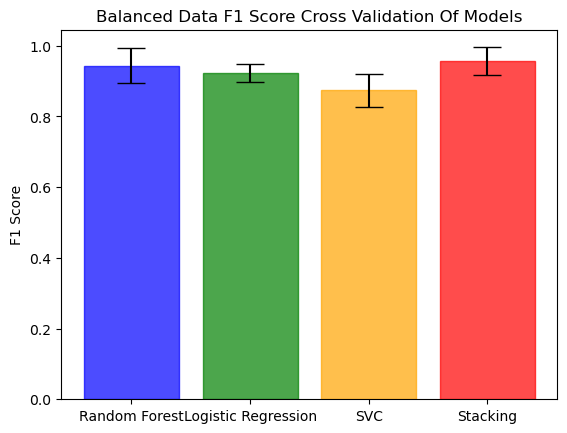

In [351]:
classifiers = [model, lr, svc, stacked_model]
classifier_names = ['Random Forest', 'Logistic Regression', 'SVC', 'Stacking']
colors = ['blue', 'green', 'orange', 'red']
results = []
for classifier, name, color in zip(classifiers, classifier_names, colors):
    scores = cross_val_score(classifier, x, y, cv=10, scoring='f1')
    results.append((name, scores.mean(), scores.std(), color))
names, mean_scores, std_scores, bar_colors = zip(*results)
fig, ax = plt.subplots()
bars = ax.bar(names, mean_scores, yerr=std_scores, align='center', alpha=0.7, capsize=10)
for bar, color in zip(bars, bar_colors):
    bar.set_color(color)
ax.set_ylabel('F1 Score')
ax.set_title('Balanced Data F1 Score Cross Validation Of Models')
plt.show()

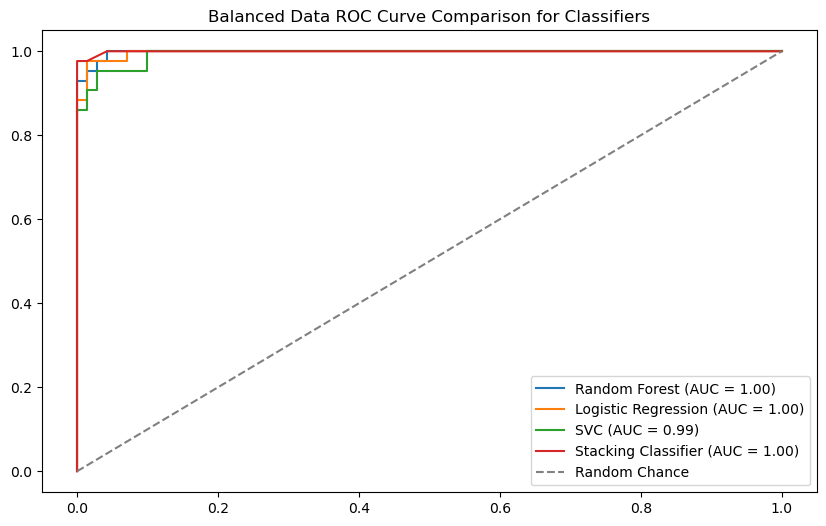

In [358]:
rfc_probs = model.predict_proba(x_test)[:, 1]
lr_probs = lr.predict_proba(x_test)[:, 1]
svc_probs = svc.predict_proba(x_test)[:, 1]
stacking_probs = stacked_model.predict_proba(x_test)[:, 1]

# Binarize the labels
y_test_bin = label_binarize(y_test, classes=[0, 1])

# Compute ROC curve and AUC for each classifier
rfc_fpr, rfc_tpr, _ = roc_curve(y_test_bin, rfc_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test_bin, lr_probs)
svc_fpr, svc_tpr, _ = roc_curve(y_test_bin, svc_probs)
stacking_fpr, stacking_tpr, _ = roc_curve(y_test_bin, stacking_probs)

rfc_auc = auc(rfc_fpr, rfc_tpr)
lr_auc = auc(lr_fpr, lr_tpr)
svc_auc = auc(svc_fpr, svc_tpr)
stacking_auc = auc(stacking_fpr, stacking_tpr)

# Plot ROC curves
plt.figure(figsize=(10, 6))
plt.plot(rfc_fpr, rfc_tpr, label=f'Random Forest (AUC = {rfc_auc:.2f})')
plt.plot(lr_fpr, lr_tpr, label=f'Logistic Regression (AUC = {lr_auc:.2f})')
plt.plot(svc_fpr, svc_tpr, label=f'SVC (AUC = {svc_auc:.2f})')
plt.plot(stacking_fpr, stacking_tpr, label=f'Stacking Classifier (AUC = {stacking_auc:.2f})')

# Plot the random chance line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Chance')

# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
plt.title('Balanced Data ROC Curve Comparison for Classifiers')
plt.legend()
plt.show()

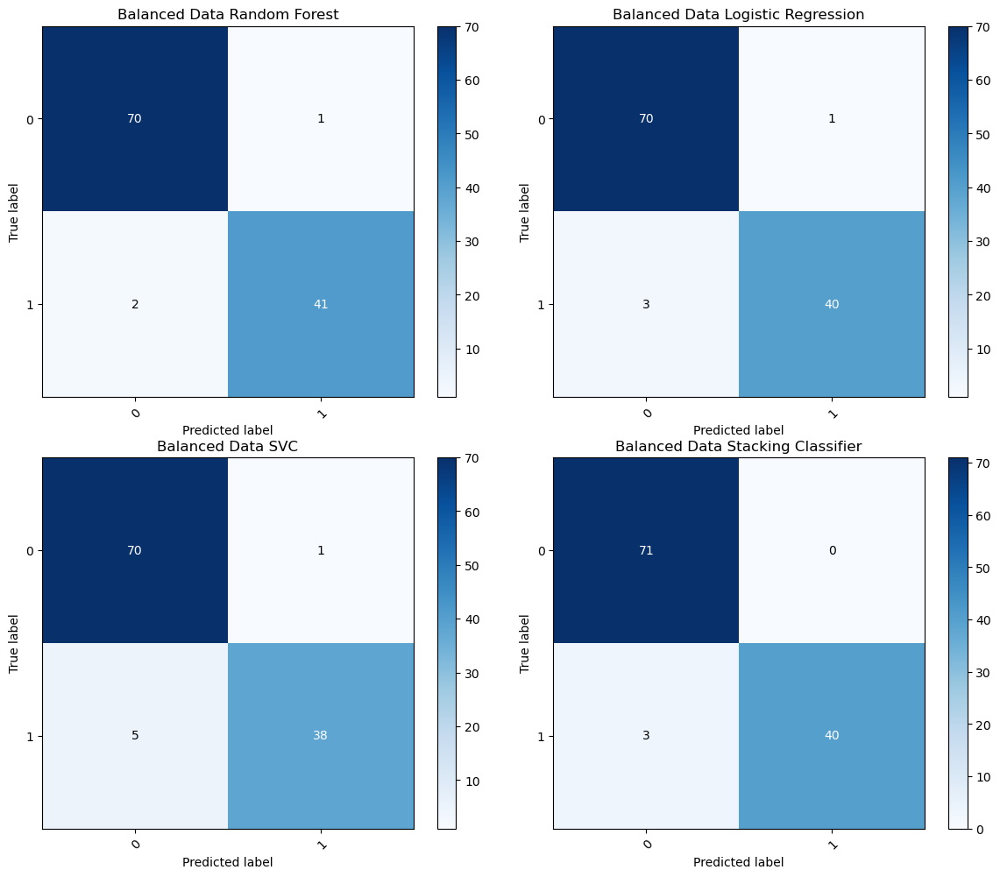

In [359]:
rfc_pred = model.predict(x_test)
lr_pred = lr.predict(x_test)
svc_pred = svc.predict(x_test)
stacking_pred = stacked_model.predict(x_test)

# Compute confusion matrices
conf_matrix_rfc = confusion_matrix(y_test, rfc_pred)
conf_matrix_lr = confusion_matrix(y_test, lr_pred)
conf_matrix_svc = confusion_matrix(y_test, svc_pred)
conf_matrix_stacking = confusion_matrix(y_test, stacking_pred)

# Plot confusion matrices
class_names = unique_labels(y_test, rfc_pred)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for ax, conf_matrix, title in zip(axes.flatten(), [conf_matrix_rfc, conf_matrix_lr, conf_matrix_svc, conf_matrix_stacking],
                                  ['Balanced Data Random Forest', 'Balanced Data Logistic Regression', 'Balanced Data SVC', 'Balanced Data Stacking Classifier']):
    im = ax.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    ax.figure.colorbar(im, ax=ax)

    # Show all ticks
    ax.set(xticks=np.arange(conf_matrix.shape[1]),
           yticks=np.arange(conf_matrix.shape[0]),
           xticklabels=class_names, yticklabels=class_names,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    # Loop over data dimensions and create text annotations
    fmt = 'd'
    thresh = conf_matrix.max() / 2.
    for i in range(conf_matrix.shape[0]):
        for j in range(conf_matrix.shape[1]):
            ax.text(j, i, format(conf_matrix[i, j], fmt),
                    ha="center", va="center",
                    color="white" if conf_matrix[i, j] > thresh else "black")

fig.tight_layout()
plt.show()

CONCLUSION

Visual Insights: Area Mean, Perimeter Mean, and Other Features
In our comprehensive analysis of breast cancer classification, we explored various models to identify the most effective one for distinguishing between benign and malignant cases. The key features under consideration included area mean, perimeter mean, and other relevant factors.
Model Selection: Stacked Classifier and Logistic Regression
After rigorous evaluation, both Stacked Classifier and Logistic Regression emerged as the most robust models, exhibiting superior performance across balanced and unbalanced datasets. Their remarkable accuracy and F1 score make them stand out in effectively reducing classification errors, yielding scores of 0.98 and 1 in the AUC percentage
Stability Across Cross-Validation Scores
Furthermore, when subjected to cross-validation, these models demonstrated remarkable stability, boasting an impressive average accuracy of 99% and a perfect F1 score of 99. This reaffirms their reliability and generalizability, crucial aspects in ensuring consistent performance across diverse datasets.
In conclusion, the Stacked Classifier and Logistic Regression models not only outperformed other contenders but also showcased resilience in handling variations within the data. Their stellar accuracy, F1 score, and AUC percentage establish them as the optimal choices for accurate and reliable breast cancer classification.